In [5]:
# @title
### EP2 MAC0417 / MAC5768
##################################################################
# AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP,#
# DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELA RESOLUÇÃO #
# DESTE EP. #
# TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM, #
# SEGUINDO AS INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM #
# DESONESTIDADE ACADÊMICA OU PLÁGIO. #
# #
# DECLARO TAMBÉM, QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS #
# DESSE PROGRAMA, E QUE EU NÃO DISTRIBUI OU FACILITEI A #
# SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E #
# DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS #
# DEFINIDOS NO CÓDIGO DE ÉTICA DA USP. #
# #
# ENTENDO QUE JUPYTER NOTEBOOKS SEM ASSINATURA NÃO SERÃO #
# CORRIGIDOS E, AINDA ASSIM, PODERÃO SER PUNIDOS POR #
# DESONESTIDADE ACADÊMICA. #
# #
# #
# Nome : Sabrina Araújo da Silva #
# NUSP : 12566182 #
# Turma: MAC0417 #
# Prof.: Ronaldo Fumio Hashimoto #
##################################################################

In [6]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 24.0
[notice] To update, run: C:\Users\Sabrina\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


Index(['Nome da imagem', 'Fundo', 'Iluminacao', 'Classe1', 'Classe2',
       'Classe3', 'Classe4', 'Classe5', 'Classe6', 'Classe7', 'Classe8',
       'Classe9', 'Classe10', 'Objeto1', 'Objeto2', 'Objeto3', 'Objeto4',
       'Objeto5', 'Objeto6', 'Objeto7', 'Objeto8', 'Objeto9', 'Objeto10',
       'gray_image', 'contrast_image', 'log_image', 'exp_image',
       'laplacian_image', 'mean_image'],
      dtype='object')
Files in database directory: ['IMG_5014.png', 'IMG_5015.png', 'IMG_5017.png', 'IMG_5019.png', 'IMG_5020.png', 'IMG_5021.png', 'IMG_5022.png', 'IMG_5023.png', 'IMG_5024.png', 'IMG_5025.png', 'IMG_5026.png', 'IMG_5027.png', 'IMG_5028.png', 'IMG_5029.png', 'IMG_5030.png', 'IMG_5031.png', 'IMG_5032.png', 'IMG_5033.png', 'IMG_5034.png', 'IMG_5035.png', 'IMG_5036.png', 'IMG_5037.png', 'IMG_5038.png', 'IMG_5039.png', 'IMG_5040.png', 'IMG_5041.png', 'IMG_5042.png', 'IMG_5043.png', 'IMG_5044.png', 'IMG_5045.png', 'IMG_5046.png', 'IMG_5047.png', 'IMG_5048.png', 'IMG_5049.png', 'IMG_50

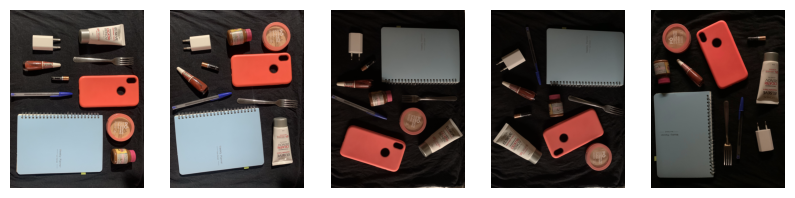

In [7]:
import pandas as pd
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

metadata = pd.read_csv('metadados.csv', delimiter=';')
print(metadata.columns)

image_column = 'Nome da imagem'

database_path = 'database/'
files_in_database = os.listdir(database_path)
print("Files in database directory:", files_in_database)

# Carrega as imagens da database
def load_images(metadata, image_column, base_path='database/'):
    images = []
    for img_name in metadata[image_column]:
        img_name_with_ext = f"{img_name}.png"
        img_path = os.path.join(base_path, img_name_with_ext)
        if os.path.exists(img_path):
            img = cv2.imread(img_path)
            if img is not None:
                img_resized = cv2.resize(img, (0, 0), fx=0.5, fy=0.5)
                images.append(img_resized)
            else:
                print(f"Warning: Unable to read image {img_path}")
        else:
            print(f"Warning: Image {img_path} does not exist")
    return images

images = load_images(metadata, image_column)

# Exibe algumas imagens carregadas para verificar a database
def display_images(images, num_images=5):
    plt.figure(figsize=(10, 10))
    for i, img in enumerate(images[:num_images]):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
    plt.show()

if images:
    display_images(images, num_images=5)
else:
    print("No images to display")


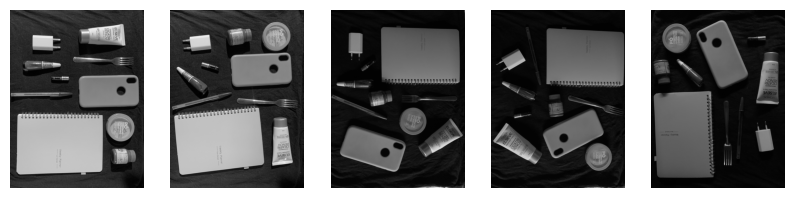

In [8]:
# Converte as imagens para níveis de cinza
def convert_to_gray(images):
    gray_images = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in images]
    return gray_images

gray_images = convert_to_gray(images)

if gray_images:
    display_images(gray_images, num_images=5)
else:
    print("No images to display")

In [9]:
# Função para aplicar transformações a todas as imagens
def apply_transformation_to_all(images, transformation_func, **kwargs):
    transformed_images = [transformation_func(img, **kwargs) for img in images]
    return transformed_images

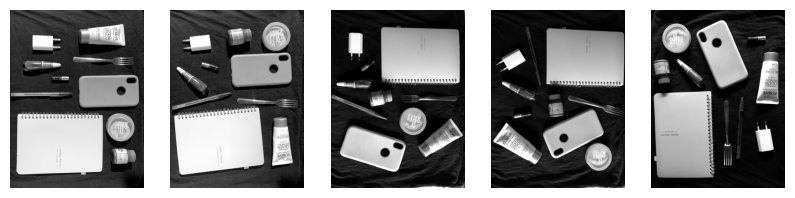

In [10]:
# Stretching de Contraste
def contrast_stretching(image):
    in_min = np.percentile(image, 2)
    in_max = np.percentile(image, 98)
    out_min = 0
    out_max = 255
    stretched = (image - in_min) * ((out_max - out_min) / (in_max - in_min)) + out_min
    stretched = np.clip(stretched, out_min, out_max)
    return stretched.astype(np.uint8)

contrast_stretching_images = apply_transformation_to_all(gray_images, contrast_stretching)

if contrast_stretching_images:
    display_images(contrast_stretching_images, num_images=5)
else:
    print("No contrast stretched images to display")

In [11]:
# Função para aplicar transformação com hiperparâmetros baseados na iluminação
def apply_transformation_with_params(images, metadata, transformation, hyperparams, illumination_column='Iluminacao'):
    transformed_images = []
    for img, img_name in zip(images, metadata[image_column]):
        illumination = metadata.loc[metadata[image_column] == img_name, illumination_column].values[0]
        params = hyperparams.get(illumination, {})
        transformed_img = transformation(img, **params)
        transformed_images.append(transformed_img)
    return transformed_images

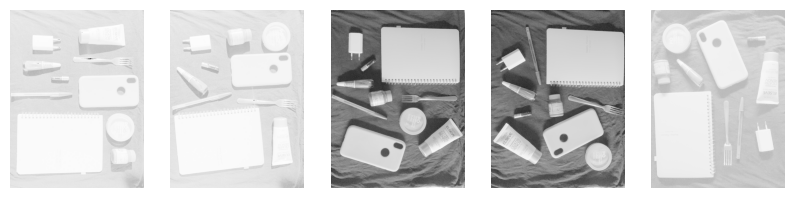

In [12]:
hyperparams_log = {
    'Iluminacao1': {'c': 1.0},
    'Iluminacao2': {'c': 0.8},
    'Iluminacao3': {'c': 1.2},
    'Iluminacao4': {'c': 1.1}
}

# Logaritmo da Imagem
def log_transform(image, c=1, epsilon=1e-5):
    log_image = c * np.log(1 + image + epsilon)
    log_image = ((log_image - log_image.min()) / (log_image.max() - log_image.min()) * 255)
    return log_image.astype(np.uint8)

log_transform_images = apply_transformation_with_params(gray_images, metadata, log_transform, hyperparams_log)

if log_transform_images:
    display_images(log_transform_images, num_images=5)
else:
    print("No log transformed images to display")

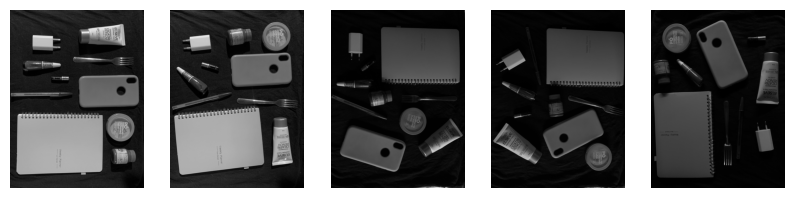

In [13]:
hyperparams_exp = {
    'Iluminacao1': {'c': 1.0, 'gamma': 0.8},
    'Iluminacao2': {'c': 0.9, 'gamma': 1.1},
    'Iluminacao3': {'c': 1.1, 'gamma': 0.9},
    'Iluminacao4': {'c': 1.0, 'gamma': 1.0}
}

# Exponencial da Imagem
def exp_transform(image, c=1, gamma=1):
    exp_image = c * np.exp(gamma * image / 255.0)
    exp_image = ((exp_image - exp_image.min()) / (exp_image.max() - exp_image.min()) * 255)
    return exp_image.astype(np.uint8)


exp_transform_images = apply_transformation_with_params(gray_images, metadata, exp_transform, hyperparams_exp)

if exp_transform_images:
    display_images(exp_transform_images, num_images=5)
else:
    print("No exponential transformed images to display")

In [14]:
# Laplaciano da Imagem
def laplacian_transform(image):
    laplacian_kernel = np.array([[0, 1, 0], 
                                 [1, -4, 1], 
                                 [0, 1, 0]])
    
    laplacian_image = np.zeros_like(image, dtype=np.float64)
    image_padded = np.pad(image, 1, mode='constant', constant_values=0)
    
    for i in range(1, image_padded.shape[0] - 1):
        for j in range(1, image_padded.shape[1] - 1):
            laplacian_image[i - 1, j - 1] = np.sum(laplacian_kernel * image_padded[i - 1:i + 2, j - 1:j + 2])
    
    laplacian_image = np.absolute(laplacian_image)
    laplacian_image = np.uint8(255 * laplacian_image / np.max(laplacian_image))
    return laplacian_image

laplacian_transform_images = apply_transformation_to_all(gray_images, laplacian_transform)

if laplacian_transform_images:
    display_images(laplacian_transform_images, num_images=5)
else:
    print("No laplacian transformed images to display")

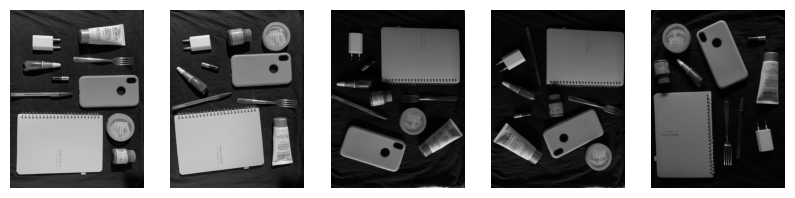

In [ ]:
# Filtro da Média
def mean_filter(image):
    kernel = np.ones((3, 3), np.float32) / 9
    
    mean_image = np.zeros_like(image, dtype=np.float64)
    image_padded = np.pad(image, 1, mode='constant', constant_values=0)
    
    for i in range(1, image_padded.shape[0] - 1):
        for j in range(1, image_padded.shape[1] - 1):
            mean_image[i - 1, j - 1] = np.sum(kernel * image_padded[i - 1:i + 2, j - 1:j + 2])
    
    mean_image = np.uint8(mean_image)
    return mean_image

mean_filter_images = apply_transformation_to_all(gray_images, mean_filter)

if mean_filter_images:
    display_images(mean_filter_images, num_images=5)
else:
    print("No mean filter images to display")

In [ ]:
# Função para criar diretórios, se não existirem
def create_directories(directories):
    for directory in directories:
        path = os.path.join(directory)
        if not os.path.exists(path):
            os.makedirs(path)
            print(f"Directory {path} created.")
        else:
            print(f"Directory {path} already exists.")

# Diretórios principais e subdiretórios
main_dirs = ['originalGrayDataset', 'augmentedDataset']
sub_dirs = ['contrast_stretching', 'log', 'exp', 'laplacian', 'mean']

# Criando diretórios principais
create_directories(main_dirs)

# Criando subdiretórios dentro de 'augmentedDataset'
augmented_dirs = [os.path.join('augmentedDataset', sub_dir) for sub_dir in sub_dirs]
create_directories(augmented_dirs)

Directory originalGrayDataset created.
Directory augmentedDataset created.
Directory augmentedDataset\contrast_stretching created.
Directory augmentedDataset\log created.
Directory augmentedDataset\exp created.
Directory augmentedDataset\laplacian created.
Directory augmentedDataset\mean created.


In [ ]:
# Função para salvar imagens em um diretório específico com sufixo
def save_images(images, dir, filenames, suffix):
    save_path = os.path.join(dir)
    for img, filename in zip(images, filenames):
        name, ext = os.path.splitext(filename)
        img_name = os.path.join(save_path, f"{name}_{suffix}{ext}")
        cv2.imwrite(img_name, img)

# Nomes dos arquivos das imagens originais
original_filenames = [f"{img_name}.png" for img_name in metadata[image_column]]

# Salvando as imagens em níveis de cinza
save_images(gray_images, 'originalGrayDataset', original_filenames, 'gray')

# Salvando as imagens transformadas nos subdiretórios apropriados
save_images(contrast_stretching_images, 'augmentedDataset/contrast_stretching', original_filenames, 'contrast')
save_images(log_transform_images, 'augmentedDataset/log', original_filenames, 'log')
save_images(exp_transform_images, 'augmentedDataset/exp', original_filenames, 'exp')
save_images(laplacian_transform_images, 'augmentedDataset/laplacian', original_filenames, 'laplacian')
save_images(mean_filter_images, 'augmentedDataset/mean', original_filenames, 'mean')


In [ ]:
# Função para atualizar o arquivo de metadados com sufixos e diretórios corretos
def update_metadata(metadata, transformations):
    new_metadata = metadata.copy()
    new_metadata['gray_image'] = metadata[image_column].apply(lambda x: os.path.join('originalGrayDataset', f"{x}_gray.png"))
    
    for suffix, subdir in transformations.items():
        new_col = f'{suffix}_image'
        new_metadata[new_col] = metadata[image_column].apply(lambda x: os.path.join('augmentedDataset', subdir, f"{x}_{suffix}.png"))
    
    return new_metadata

# Lista de transformações aplicadas e respectivos subdiretórios
transformations = {
    'contrast': 'contrast_stretching',
    'log': 'log',
    'exp': 'exp',
    'laplacian': 'laplacian',
    'mean': 'mean'
}

# Atualizando os metadados
updated_metadata = update_metadata(metadata, transformations)

# Salvando o novo arquivo de metadados
updated_metadata.to_csv('metadados.csv', index=False, sep=';')
print("Updated metadata saved to metadados.csv")


Updated metadata saved to metadados.csv


In [ ]:
import matplotlib.image as mpimg

def visualize_dataset(dataset_folder, columns=20, image_size=(2, 2)):
    for subdir, _, files in os.walk(dataset_folder):
        images = [file for file in files if file.endswith('.png') or file.endswith('.jpg') or file.endswith('.jpeg')]
        
        num_images = len(images)
        if num_images == 0:
            continue 
        
        rows = (num_images + columns - 1) // columns
        
        plt.figure(figsize=(columns * image_size[0], rows * image_size[1]))
        for i, file in enumerate(images, 1):
            image = mpimg.imread(os.path.join(subdir, file))
    
            plt.subplot(rows, columns, i)
            plt.imshow(image, cmap='gray')
            plt.axis('off')
    
        plt.suptitle(f"Visualizing {subdir}")
        plt.subplots_adjust(wspace=0, hspace=0)
        plt.show()

In [ ]:
visualize_dataset('originalGrayDataset')

NameError: name 'os' is not defined

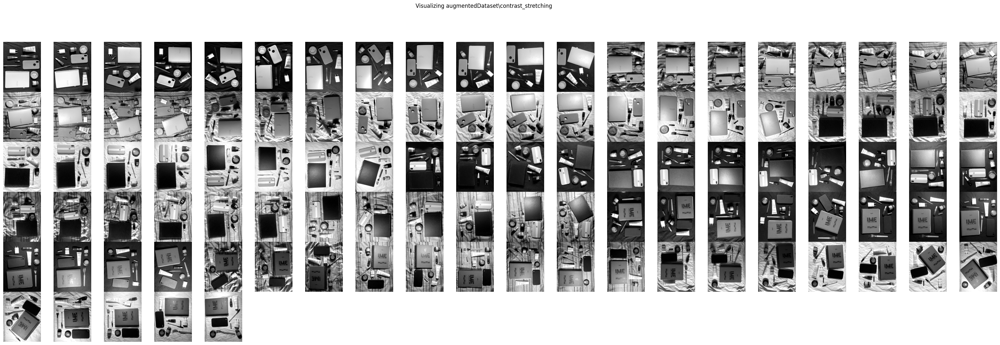

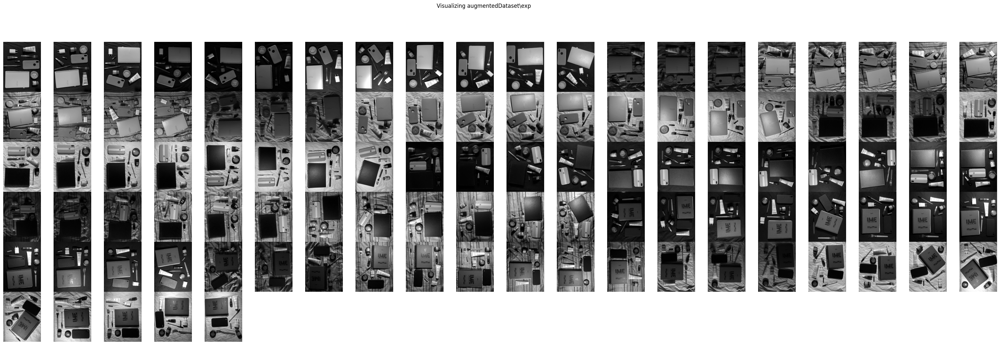

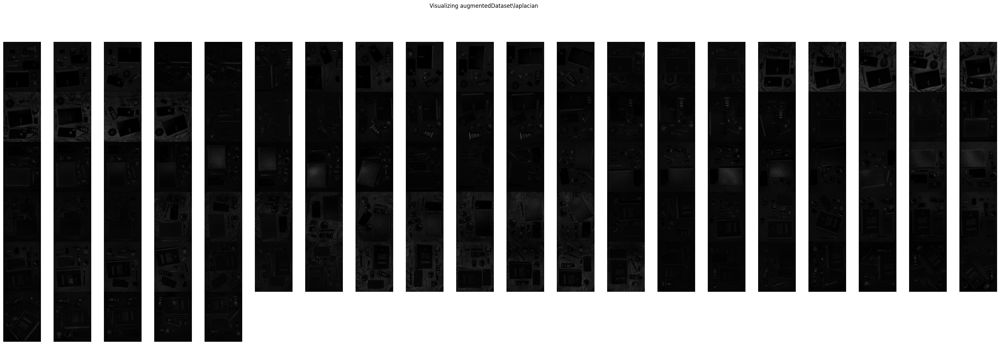

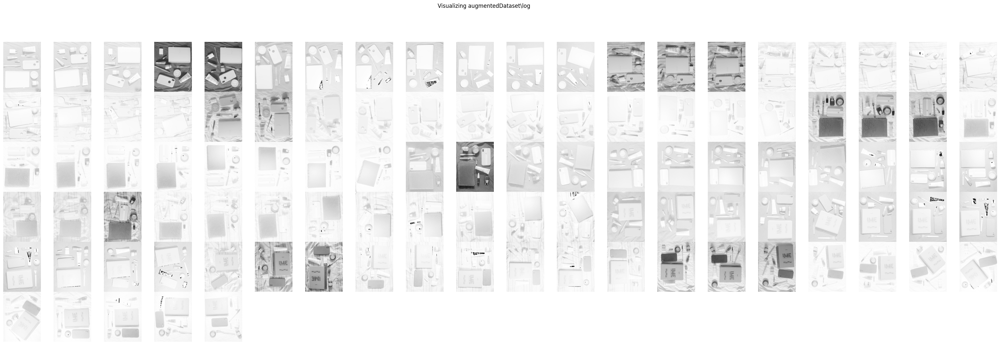

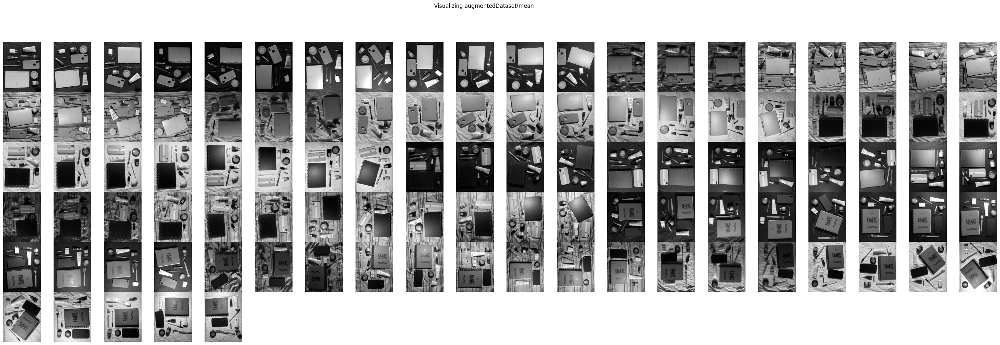

In [17]:
visualize_dataset('augmentedDataset')